# Set up

In [3]:
import dask
import xarray as xr
import matplotlib as mpl
import matplotlib.pyplot as plt
import math
import cartopy.crs as ccrs
import numpy as np
from matplotlib.animation import FuncAnimation
from datetime import datetime as dt

In [4]:
# historical data
east_hist = 'ua_Amon_CESM2-WACCM-FV2_historical_r1i1p1f1_gn_200001-201412.nc'
north_hist = 'va_Amon_CESM2-WACCM-FV2_historical_r1i1p1f1_gn_200001-201412.nc'

# new data
east_new = 'ua_Amon_CESM2-WACCM_ssp126_r1i1p1f1_gn_201501-206412.nc'
north_new = 'va_Amon_CESM2-WACCM_ssp126_r1i1p1f1_gn_201501-206412.nc'

In [5]:
ds_hist = xr.open_mfdataset('H:/Summer24-25/Jupyter/Proper/windfields/*WACCM-FV2_historical*.nc') 
ds_new = xr.open_mfdataset('H:/Summer24-25/Jupyter/Proper/windfields/*WACCM_ssp126*.nc') 
ds_combined = xr.open_mfdataset('H:/Summer24-25/Jupyter/Proper/windfields/*.nc') 

C:\Python312\Lib\site-packages\xarray\conventions.py:289: SerializationWarning: variable 'ua' has multiple fill values {np.float32(1e+20), np.float64(1e+20)} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python312\Lib\site-packages\xarray\conventions.py:289: SerializationWarning: variable 'va' has multiple fill values {np.float32(1e+20), np.float64(1e+20)} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python312\Lib\site-packages\xarray\conventions.py:289: SerializationWarning: variable 'ua' has multiple fill values {np.float32(1e+20), np.float64(1e+20)} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python312\Lib\site-packages\xarray\conventions.py:289: SerializationWarning: variable 'va' has multiple fill values {np.float32(1e+20), np.float64(1e+20)} defined, decoding all values to NaN.
  var = coder.decode(var, name=name)
C:\Python312\Lib\site-packages\xarray\conventions.py:289: SerializationW

# Separate

In [8]:
date = dt.strptime(str(ds_hist.time.isel(time=25).values), '%Y-%m-%d %H:%M:%S')
print('original: %s' %date)

formatted_date = date.strftime('%d %B, %Y')
print('formatted: %s' %formatted_date)

original: 2002-02-14 00:00:00
formatted: 14 February, 2002


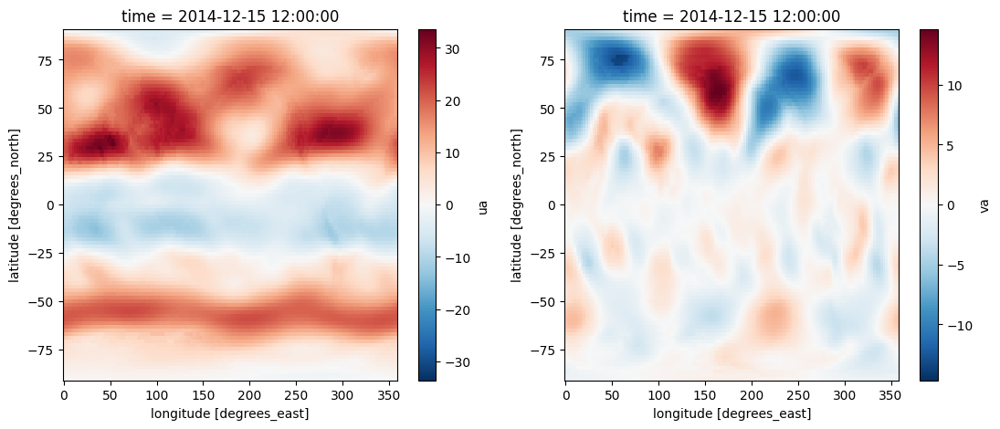

In [14]:
fig,(ax1, ax2) = plt.subplots(1,2, figsize=(13,5))
ds_hist.ua.isel(time=-1).mean(dim='plev').plot(ax=ax1)
ds_hist.va.isel(time=-1).mean(dim='plev').plot(ax=ax2)

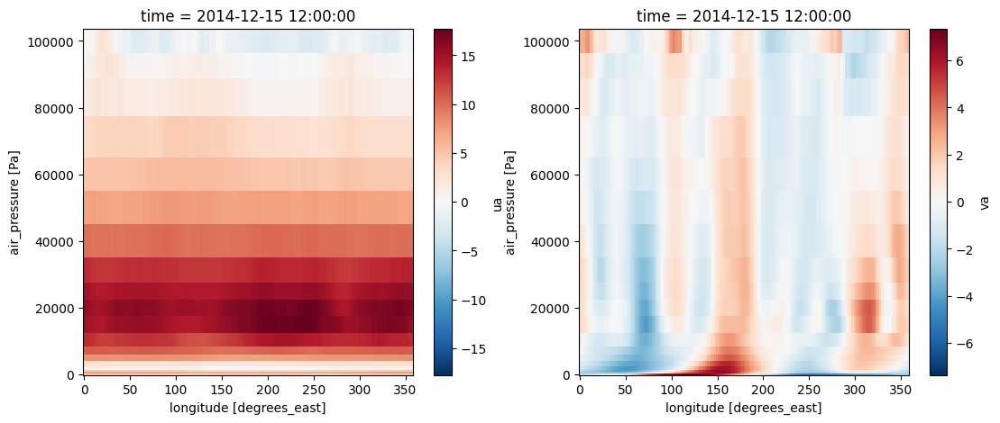

In [15]:
mean_dim = 'lat'
# mean_dim = 'plev' # average pressure, y-axis=latitude level
fig,(ax1, ax2) = plt.subplots(1,2, figsize=(13,5))
ds_hist.ua.isel(time=-1).mean(dim=mean_dim).plot(ax=ax1)
ds_hist.va.isel(time=-1).mean(dim=mean_dim).plot(ax=ax2)

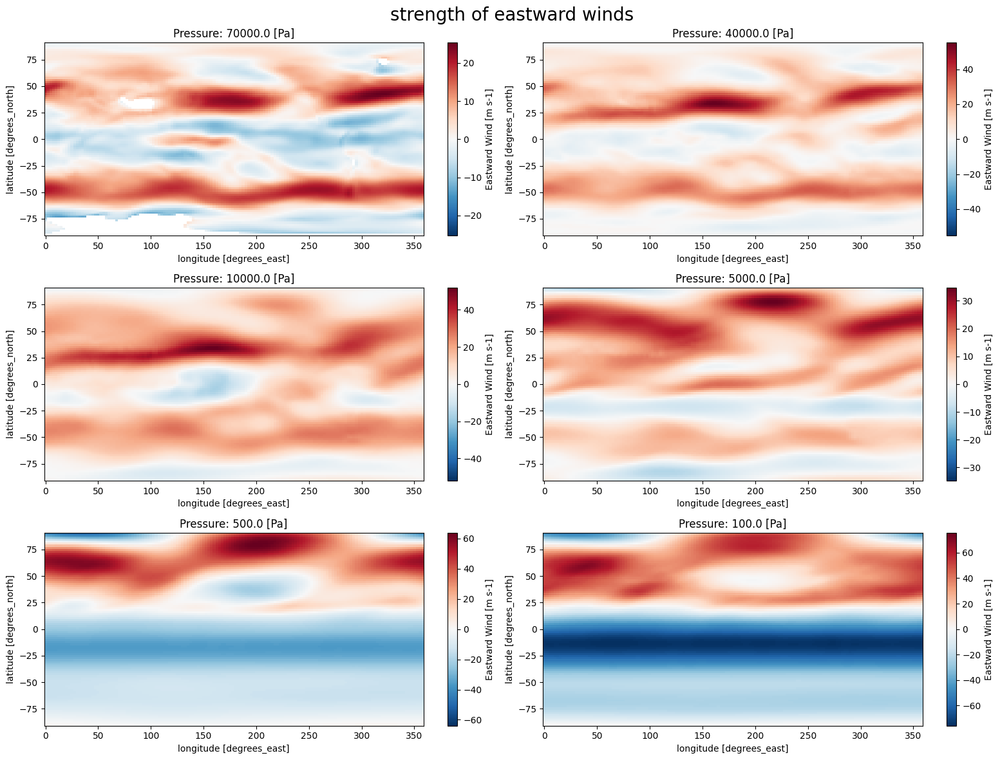

In [11]:
plevs = [70000, 40000, 10000, 5000, 500, 100] # measured in Pa
row,col = math.ceil(len(plevs)**0.5), round(len(plevs)**0.5)

fig, axs = plt.subplots(row,col, figsize=(col*8, row*4), layout='tight')
fig.suptitle('strength of eastward winds', size=20) 
# fig.suptitle('strength of northern winds', size=20) 
i = 0
for row in axs:
    for ax in row:
        if i < len(plevs):
            ds_hist.ua.isel(time=0).sel(plev=plevs[i]).plot(ax=ax)
            # ds_hist.va.isel(time=0).sel(plev=plevs[i]).plot(ax=ax) # uncomment and comment out above to get northern winds
            ax.set_title('Pressure: %s [Pa]' %(ds_hist.plev.sel(plev=plevs[i]).values))
            i += 1
        else:
            ax.remove()


In [ ]:
mean_dim = 'lat'
# mean_dim = 'plev' # average pressure, y-axis=latitude level
fig,(ax1, ax2) = plt.subplots(1,2, figsize=(13,5))
ds_hist.ua.isel(time=-1).mean(dim=mean_dim).plot(ax=ax1)
ds_hist.va.isel(time=-1).mean(dim=mean_dim).plot(ax=ax2)

times = [''] # measured in Pa
row,col = len(plevs), 2

fig, axs = plt.subplots(row,col, figsize=(col*8, row*4), layout='tight')
fig.suptitle('strength of eastward winds', size=20) 
# fig.suptitle('strength of northern winds', size=20) 
i = 0
for row in axs:
    for ax in row:
        if i < len(times):
            ds_hist.ua.sel(times=times[i]).plot(ax=ax)
            # ds_hist.va.isel(time=0).sel(plev=plevs[i]).plot(ax=ax) # uncomment and comment out above to get northern winds
            ax.set_title('Pressure: %s [Pa]' %(ds_hist.plev.sel(plev=plevs[i]).values))
            i += 2
        else:
            ax.remove()


# Quiver

CPU times: total: 15.6 ms
Wall time: 18.9 ms


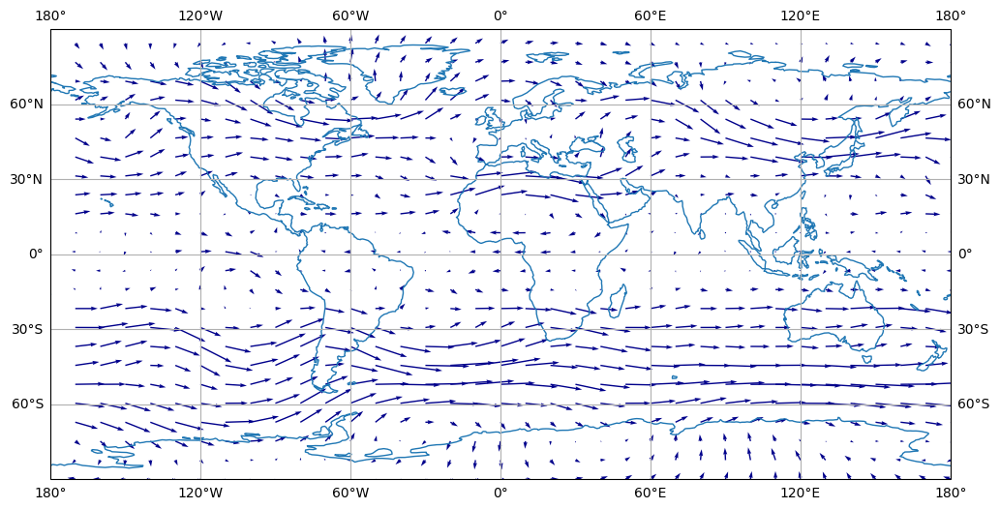

In [32]:
%%time
n=100
p=6
ds = ds_hist

fig = plt.figure(figsize=(12,8))
ax = plt.axes(projection=ccrs.PlateCarree())
pu = ds.ua.isel(plev=p, time=n)[::4, ::4] # slicing to get every 4th element
pv = ds.va.isel(plev=p, time=n)[::4, ::4]


qv = ax.quiver(pu.lon, pu.lat, pu, pv, transform=ccrs.PlateCarree(), scale=700, width=0.0015, color='darkblue')
# ax.set_extent([-60,0,0,60])
ax.coastlines(color='tab:blue')
ax.gridlines(draw_labels=True)

CPU times: total: 46.9 ms
Wall time: 50.9 ms


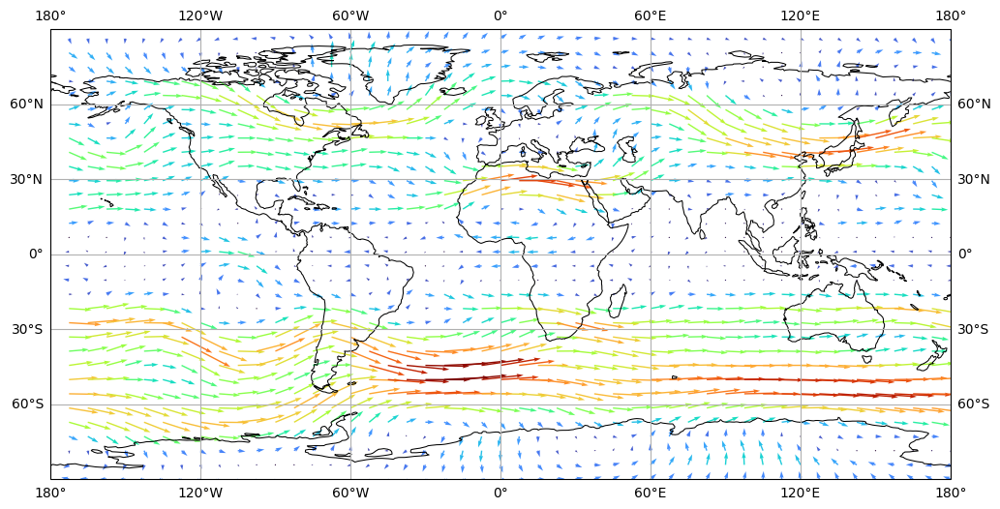

In [106]:
%%time
n=100
p=6
ds = ds_hist

fig = plt.figure(figsize=(12,8))
ax = plt.axes(projection=ccrs.PlateCarree())
pu = ds.ua.isel(plev=p, time=n)[::3, ::3] # slicing to get every 4th element
pv = ds.va.isel(plev=p, time=n)[::3, ::3]
windspeed = (pv**2 + pu**2)**0.5

qv = ax.quiver(pu.lon, pu.lat, pu, pv, windspeed, cmap='turbo', transform=ccrs.PlateCarree(), scale=700, width=0.0015)
# ax.set_extent([-60,0,0,60])
ax.coastlines(color='k', lw=0.75)
ax.gridlines(draw_labels=True)

CPU times: total: 1 s
Wall time: 1.78 s


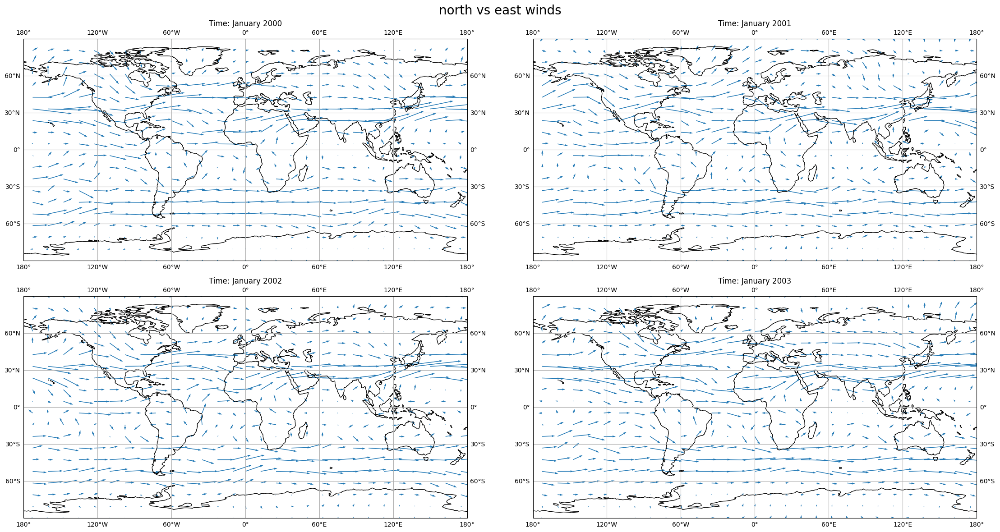

In [85]:
%%time
ds = ds_hist
times = np.arange(0,12*4, 12)
row,col = math.ceil(len(times)**0.5), round(len(times)**0.5)

fig, axs = plt.subplots(row,col, figsize=(col*12, row*6), layout='tight', subplot_kw=
                        {'projection': ccrs.PlateCarree()})
fig.suptitle('north vs east winds', size=20)
i = 0
for row in axs:
    for ax in row:
        if i < len(times):
            u = ds.ua.isel(plev=9, time=times[i])[::5, ::5] # slicing to get every 4th point
            v = ds.va.isel(plev=9, time=times[i])[::5, ::5]
            ax.quiver(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), scale=800, width=0.0015, color='tab:blue')
            ax.coastlines(color='k')
            ax.gridlines(draw_labels=True)
            
            date = dt.strptime(str(ds.time[times[i]].values), '%Y-%m-%d %H:%M:%S')
            formatted = date.strftime('%B %Y')
            ax.set_title('Time: %s' %formatted)
            
            i += 1
        else:
            ax.remove()

fig.savefig('quiver_wind.png') #note: for the bigger plots, they will look bad in the notebook **they will be higher quality/clearer downloaded**

In [86]:
date = dt.strptime(str(ds_combined.time[180].values), '%Y-%m-%d %H:%M:%S')
prediction_point = dt.strptime('1/1/15', '%x')
formatted = date.strftime('%x')
if(prediction_point < date):
    print(formatted)
else:
    print('1/1/15 is less than %s' %formatted)

01/15/15


CPU times: total: 2min 38s
Wall time: 2min 59s


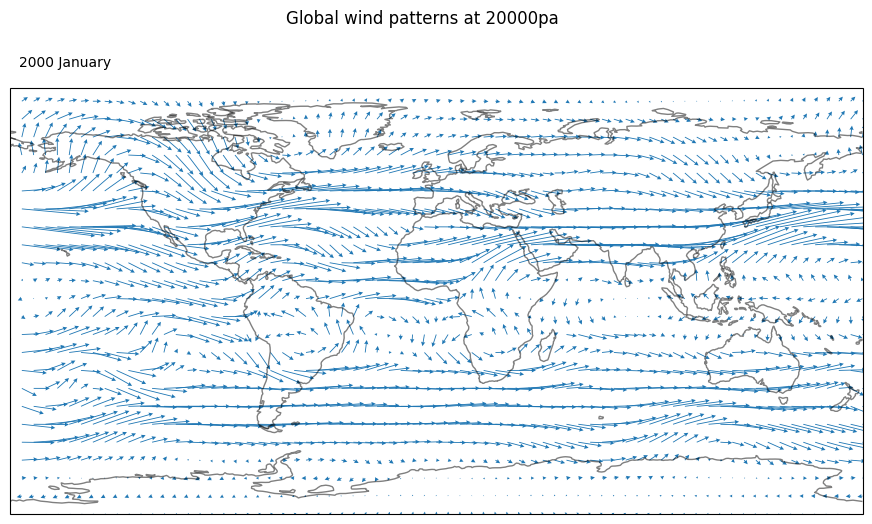

In [151]:
%%time

# required values for animation
ds = ds_combined
pressure = 20000
frames = ds.time.size
col = 'tab:blue' #colour of quiver plot arrows
prediction_point = dt.strptime('1/1/15', '%x') # time where data switches from historical data to predicted values
prediction_col = 'indianred' #colour to switch to when predicting

fig = plt.figure(figsize=(11,6))
ax = plt.axes(projection=ccrs.PlateCarree())

fig.suptitle('Global wind patterns at %spa' %pressure)

def animate(num, col=col):
    ax.clear()
    date = dt.strptime(str(ds.time[num].values), '%Y-%m-%d %H:%M:%S')
    if(prediction_point < date):
        col = prediction_col
        ax.text(0.99, 1.05, 'Future predicted values', transform=ax.transAxes, ha='right', color = col, size = 15)

    formatted = date.strftime('%Y %B')
    ax.text(0.01, 1.05, formatted, ha='left', transform=ax.transAxes)
    
    u = ds.ua.isel(time=num).sel(plev=pressure)[::4, ::4] # slicing to get every 4th element
    v = ds.va.isel(time=num).sel(plev=pressure)[::4, ::4]
    
    qv = ax.quiver(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), scale=800, width=0.001, color=col, headwidth=5)

    ax.coastlines(color='k', alpha=0.5)
    # ax.gridlines(draw_labels=True, color='none')
    

ani = FuncAnimation(fig, animate, interval=200, frames=frames)
ani.save('wind_qv_basic.gif', writer='pillow')

CPU times: total: 1min 19s
Wall time: 1min 25s


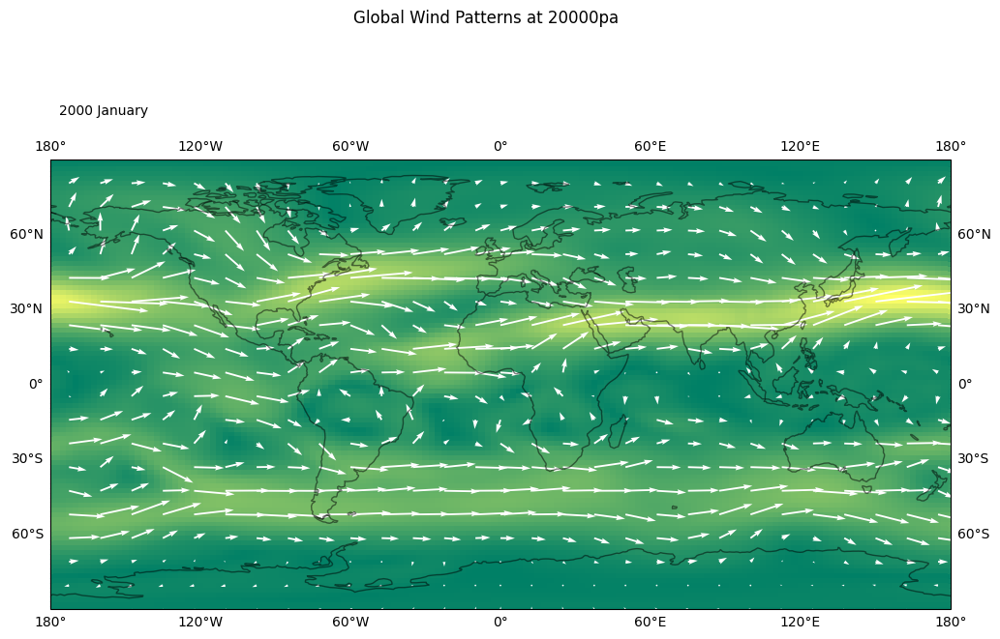

In [152]:
%%time

ds = ds_hist
pressure = 20000
frames = ds.ua.time.size


fig = plt.figure(figsize=(12,8))
ax = plt.axes(projection=ccrs.PlateCarree())

fig.suptitle('Global Wind Patterns at %spa' %pressure)

def animate(num):
    ax.clear()
    u = ds.ua.isel(time=num).sel(plev=pressure)
    v = ds.va.isel(time=num).sel(plev=pressure)
    
    windspeed = (u**2 + v**2)**0.5
    windspeed.plot(ax=ax, transform=ccrs.PlateCarree(), cmap='summer')
    ax.collections[-2].colorbar.remove()

    u = u[::5, ::5]# slicing to get every 5th element
    v = v[::5, ::5]
    
    qv = ax.quiver(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), scale=800, width=0.002, color='w')
    
    date = dt.strptime(str(ds.time[num].values), '%Y-%m-%d %H:%M:%S')
    formatted = date.strftime('%Y %B')
    ax.text(0.01, 1.1, formatted, ha='left', transform=ax.transAxes)
    ax.set_title('')
    ax.coastlines(color='k', alpha=0.5)
    ax.gridlines(draw_labels=True, color='none')
    

ani = FuncAnimation(fig, animate, interval=200, frames=frames)
ani.save('wind_qv_background.gif', writer='pillow')

CPU times: total: 15.3 s
Wall time: 16.9 s


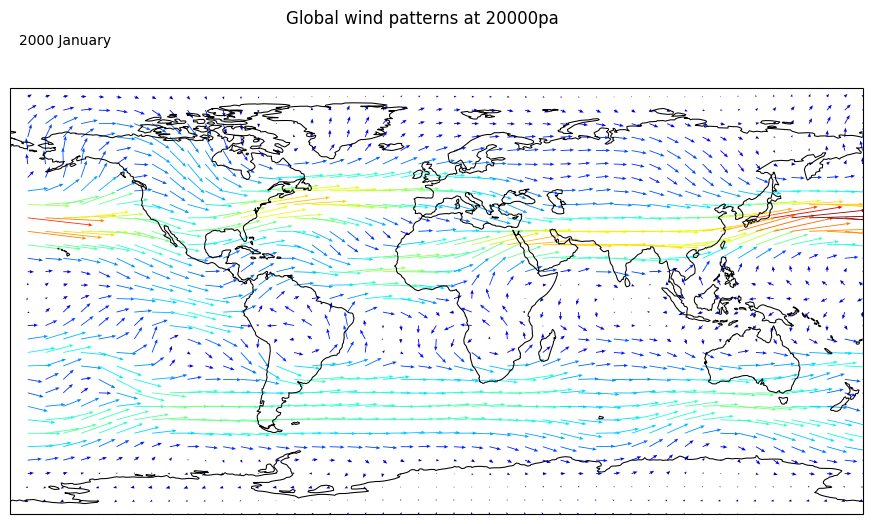

In [153]:
%%time

ds = ds_hist
pressure = 20000
frames = ds.ua.time.size

fig = plt.figure(figsize=(11,6))
ax = plt.axes(projection=ccrs.PlateCarree())

fig.suptitle('Global wind patterns at %spa' %pressure)

def animate(num):
    ax.clear()
    u = ds.ua.isel(time=num).sel(plev=pressure)[::3, ::3] # slicing to get every 4th element
    v = ds.va.isel(time=num).sel(plev=pressure)[::3, ::3]
    windspeed = (u**2 + v**2)**0.5
    
    qv = ax.quiver(u.lon, u.lat, u, v, windspeed, transform=ccrs.PlateCarree(), scale=900, width=0.001, cmap='jet', headwidth=4)

    ax.coastlines(color='k', linewidth=0.75)
    # ax.gridlines(draw_labels=True, color='none')

    date = dt.strptime(str(ds.time[num].values), '%Y-%m-%d %H:%M:%S')
    formatted = date.strftime('%Y %B')
    ax.text(0.01, 1.1, formatted, ha='left', transform=ax.transAxes)
    

ani = FuncAnimation(fig, animate, interval=200, frames=frames)
ani.save('wind_qv_colour.gif', writer='pillow')

CPU times: total: 30.9 s
Wall time: 32.8 s


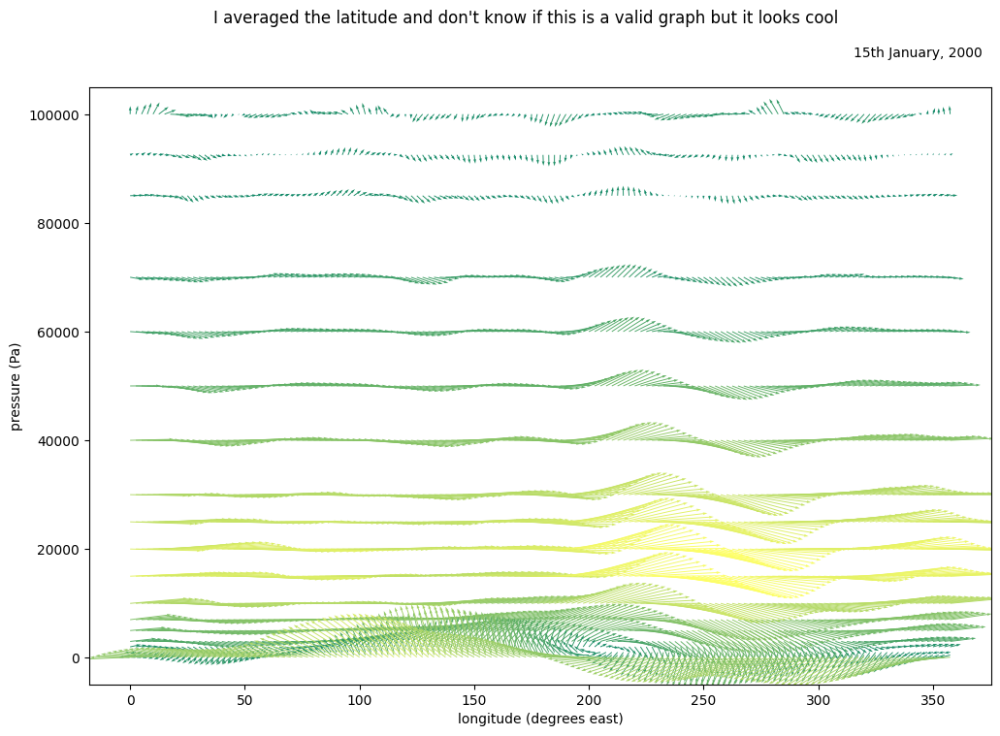

In [150]:
%%time
#animation by time, average lat (or plev)
ds = ds_hist
mean_dim = 'lat' #'plev'
frames = ds.time.size

fig = plt.figure(figsize=(12,8))
ax = plt.axes()

# date = dt.strptime(str(ds.time[0].values), '%Y-%m-%d %H:%M:%S')
# print('original: %s' %date)

# formatted_date = date.strftime('%d %B, %Y')
# print('formatted: %s' %formatted_date)

fig.suptitle('I averaged the latitude and don\'t know if this is a valid graph but it looks cool')

def animate(num):
    ax.clear()
    date = dt.strptime(str(ds.time[num].values), '%Y-%m-%d %H:%M:%S')
    formatted = date.strftime('%dth %B, %Y')
    ax.text(0.99, 1.05, formatted, ha='right', transform=ax.transAxes)
    
    u = ds.ua.isel(time=num).mean(dim=mean_dim) # slicing to get every 4th element
    v = ds.va.isel(time=num).mean(dim=mean_dim)
    windspeed = (v**2 + u**2)**0.5
    
    qv = ax.quiver(u.lon, u.plev, u, v, windspeed, scale=200, width=0.001, cmap='summer')
    ax.set_xlabel('longitude (degrees east)')
    ax.set_ylabel('pressure (Pa)')

ani = FuncAnimation(fig, animate, interval=200, frames=frames)
ani.save('wind_mean-lat.gif', writer='pillow')

# Streamline

CPU times: total: 5.98 s
Wall time: 4.71 s


Text(0.5, 1.0, '')

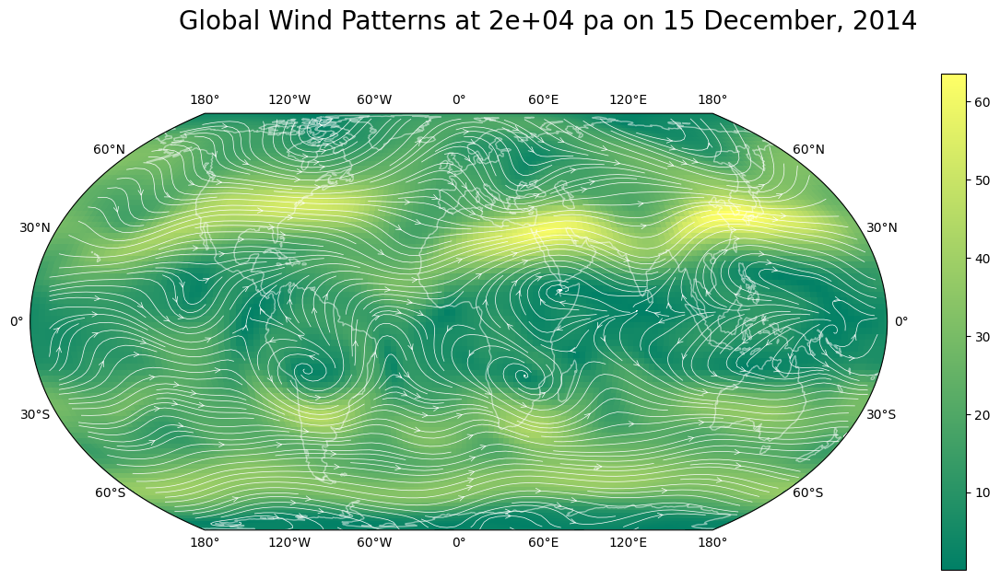

In [133]:
%%time

ds = ds_hist
n=-1

fig = plt.figure(figsize=(15,7))
ax = plt.axes(projection=ccrs.EqualEarth())

pu = ds.ua.isel(plev=9, time=-1)
pv = ds.va.isel(plev=9, time=-1)

windspeed = (pu**2 + pv**2)**0.5

pu = pu[::2,::2]
pv = pv[::2,::2]

ax.streamplot(pu.lon, pu.lat, pu, pv, transform=ccrs.PlateCarree(), density=3, arrowstyle='->', color='w', linewidth=0.5)
windspeed.plot(ax=ax, transform=ccrs.PlateCarree(), cmap='summer')
ax.coastlines(color='w', alpha=0.5, lw=1)
ax.gridlines(draw_labels=True, color='none')
date = dt.strptime(str(ds.time[n].values), '%Y-%m-%d %H:%M:%S')
formatted = date.strftime('%d %B, %Y')
fig.suptitle('Global Wind Patterns at %.g pa on %s' %(ds.plev[9].values, formatted), size=20)
ax.set_title('')

CPU times: total: 3.39 s
Wall time: 1.32 s


Text(0.5, 1.0, '')

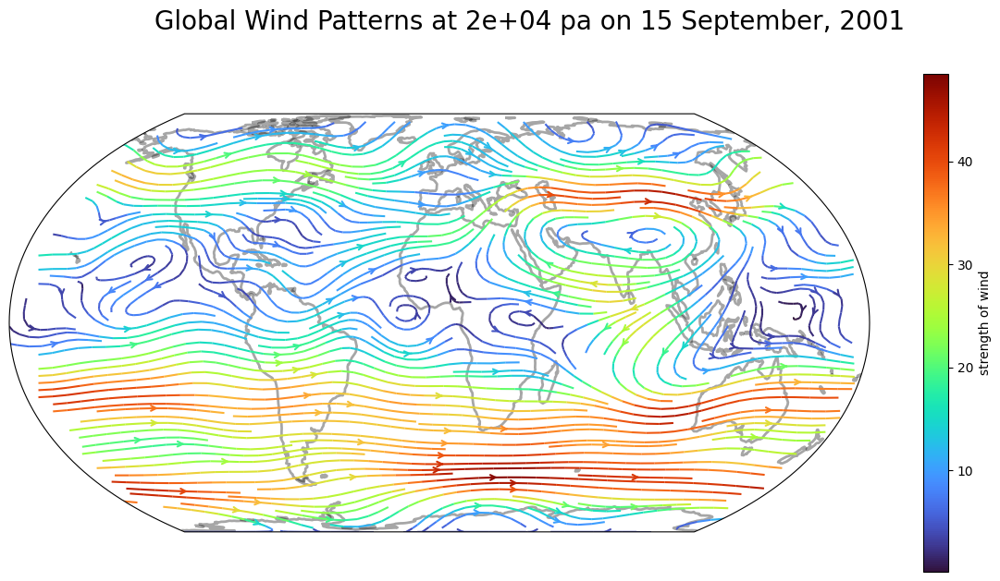

In [143]:
%%time

ds = ds_hist
n = 20
p = 10

fig = plt.figure(figsize=(15,7))
ax = plt.axes(projection=ccrs.EqualEarth())

u = ds.ua.isel(plev=p, time=n)[::2, ::2]
v = ds.va.isel(plev=p, time=n)[::2, ::2]
windspeed = (u**2 + v**2)**0.5

strm = ax.streamplot(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), density=2, arrowstyle='->', color=windspeed.values, cmap='turbo')
fig.colorbar(strm.lines, ax=ax, label='strength of wind')
ax.coastlines(color='k', alpha=0.35, lw=2)
date = dt.strptime(str(ds.time[n].values), '%Y-%m-%d %H:%M:%S')
formatted = date.strftime('%d %B, %Y')
fig.suptitle('Global Wind Patterns at %.g pa on %s' %(ds.plev[p].values, formatted), size=20)
ax.set_title('')

CPU times: total: 7.28 s
Wall time: 3.49 s


Text(0.5, 0.98, 'Global Wind Patterns at 2e+04 pa during December 2014')

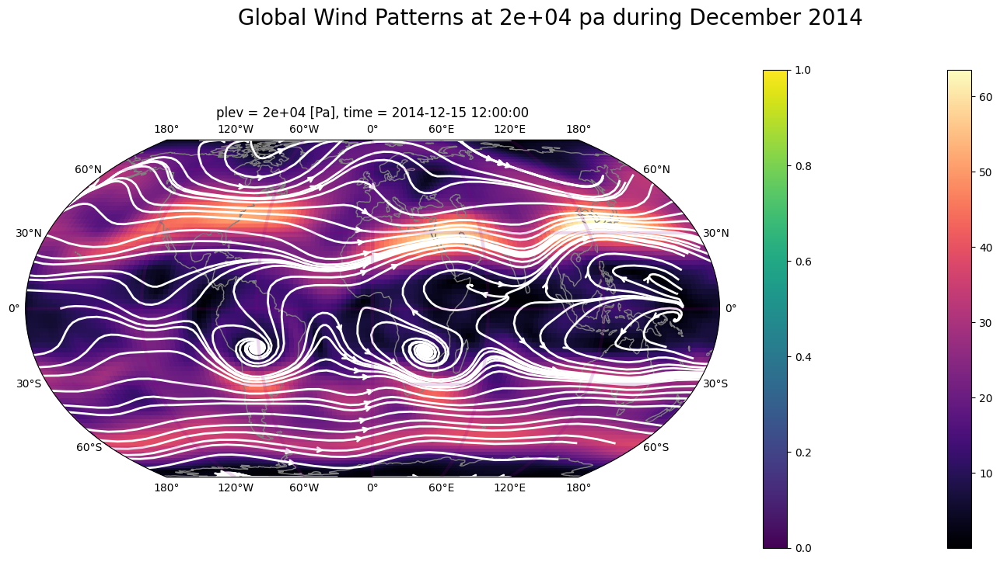

In [93]:
%%time
# streamplot with continuous lines
ds = ds_hist
n=-1

fig = plt.figure(figsize=(18,8))
ax = plt.axes(projection=ccrs.EqualEarth())

pu = ds.ua.isel(plev=9, time=n)
pv = ds.va.isel(plev=9, time=n)

windspeed = (pu**2 + pv**2)**0.5
windspeed.plot(ax=ax, transform=ccrs.PlateCarree(), cmap='magma')

strm = ax.streamplot(pu.lon, pu.lat, pu, pv, transform=ccrs.PlateCarree(), color='w', arrowstyle='->', density = 0.7, linewidth=2, broken_streamlines=False)

plt.colorbar(strm.lines)
# ax.set_extent([-60,0,0,60])
ax.coastlines(color='grey')
ax.gridlines(draw_labels=True, color='darkmagenta', lw=3, alpha=0.15)
date = dt.strptime(str(ds.time[n].values), '%Y-%m-%d %H:%M:%S')
formatted = date.strftime('%B %Y')
fig.suptitle('Global Wind Patterns at %.g pa during %s' %(ds.plev[9].values, formatted), size=20)


CPU times: total: 5.8 s
Wall time: 1.95 s


Text(0.5, 0.98, 'Global Wind Patterns at 2e+04 pa during December 2014')

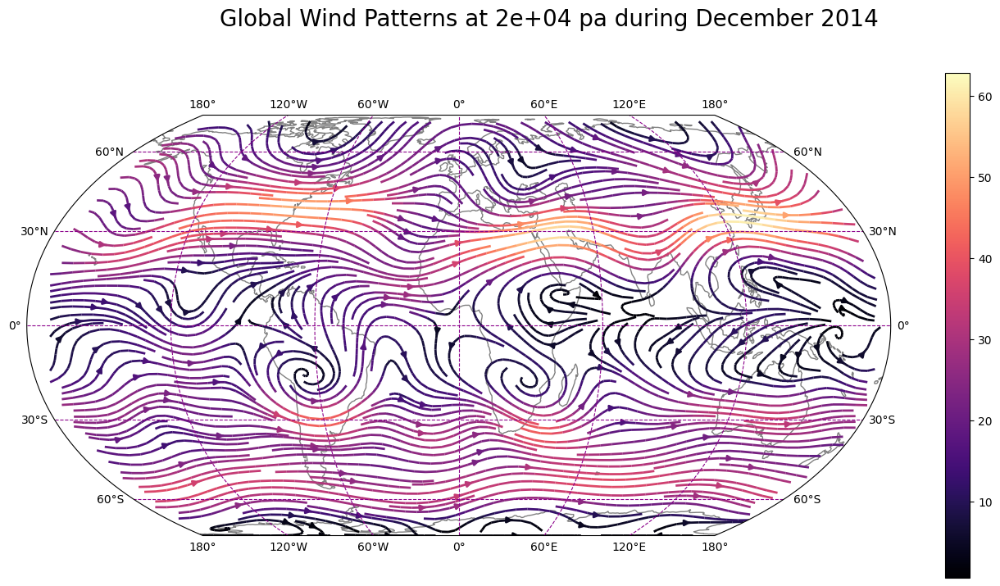

In [94]:
%%time
#streamplot with line colour of strength
ds = ds_hist
n=-1

fig = plt.figure(figsize=(17,8))
ax = plt.axes(projection=ccrs.EqualEarth())

pu = ds.ua.isel(plev=9, time=-1)[::2,::2]
pv = ds.va.isel(plev=9, time=-1)[::2,::2]

windspeed = (pu**2 + pv**2)**0.5

strm = ax.streamplot(pu.lon, pu.lat, pu, pv, transform=ccrs.PlateCarree(), color=windspeed.values, cmap='magma', density = 2.5, linewidth=2)

plt.colorbar(strm.lines)
# ax.set_extent([-60,0,0,60])
ax.coastlines(color='grey')
ax.gridlines(draw_labels=True, ls='--', color='darkmagenta')
formatted = date.strftime('%B %Y')
fig.suptitle('Global Wind Patterns at %.g pa during %s' %(ds.plev[9].values, formatted), size=20)

CPU times: total: 13.5 s
Wall time: 4.89 s


Text(0.5, 1.0, '')

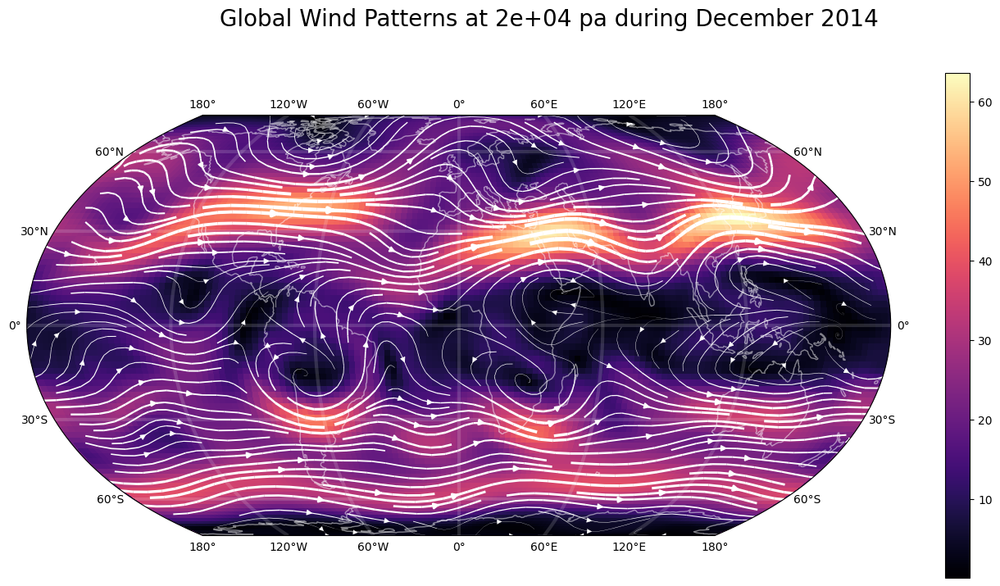

In [110]:
%%time

# streamplot - linewidth varies by windspeed, background of windspeed
ds = ds_hist
n=-1 # picking timestep

# creating container
fig = plt.figure(figsize=(17,8))
ax = plt.axes(projection=ccrs.EqualEarth())

# selecting pressure level, time
u = ds.ua.isel(plev=9, time=n)
v = ds.va.isel(plev=9, time=n)

# calculating and plotting strength of wind
windspeed = (u**2 + v**2)**0.5
windspeed.plot(ax=ax, cmap='magma', transform=ccrs.PlateCarree())

# transforming windspeed into usable format for line width

lw = 4* (windspeed.values / windspeed.values.max())

# plotting vectors of wind
strm=ax.streamplot(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), color='w', linewidth=lw, density = 2)


ax.coastlines(color='w', alpha=0.5)
ax.gridlines(draw_labels=True, color='w', lw=3, alpha=0.15)
date = dt.strptime(str(ds.time[n].values), '%Y-%m-%d %H:%M:%S')
formatted = date.strftime('%B %Y')
fig.suptitle('Global Wind Patterns at %.g pa during %s' %(ds.plev[9].values, formatted), size=20)
ax.set_title('')

CPU times: total: 2.55 s
Wall time: 1.56 s


Text(0.5, 1.0, '')

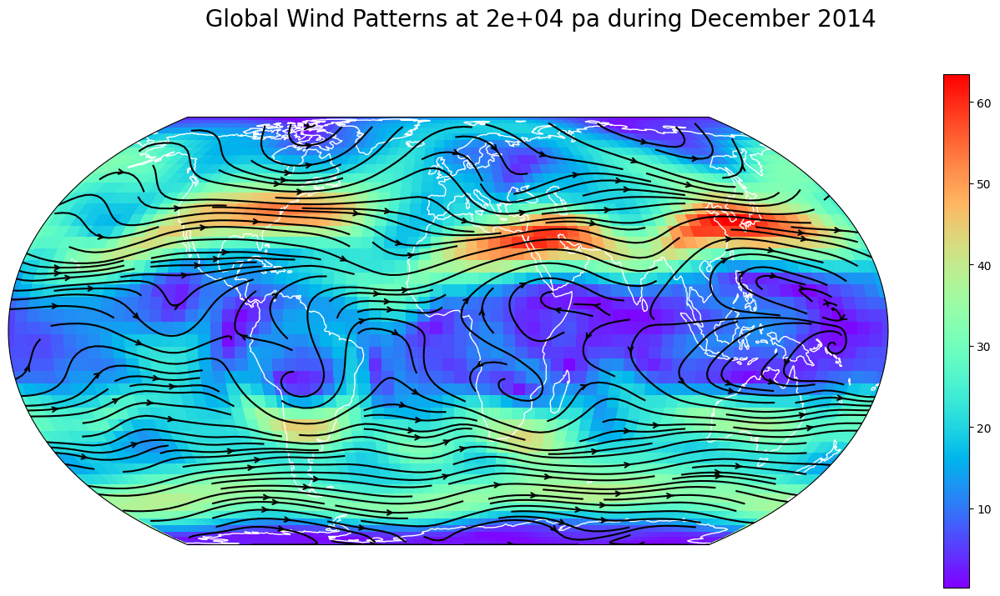

In [74]:
%%time

# streamplot - density varies
ds = ds_hist
n=-1

fig = plt.figure(figsize=(17,8))
ax = plt.axes(projection=ccrs.EqualEarth())

pu = ds.ua.isel(plev=9, time=n)[::2, ::2]
pv = ds.va.isel(plev=9, time=n)[::2, ::2]

windspeed = (pu**2 + pv**2)**0.5

windspeed.plot(ax=ax, cmap='rainbow', transform=ccrs.PlateCarree())
strm=ax.streamplot(pu.lon, pu.lat, pu, pv, transform=ccrs.PlateCarree(), density=[1,3], arrowstyle='->', color='k', linewidth=1.5)


ax.coastlines(color='w')
date = dt.strptime(str(ds.time[n].values), '%Y-%m-%d %H:%M:%S')
formatted = date.strftime('%B %Y')
fig.suptitle('Global Wind Patterns at %.g pa during %s' %(ds.plev[9].values, formatted), size=20)
ax.set_title('')

CPU times: total: 6.8 s
Wall time: 4.94 s


Text(0.5, 1.0, '')

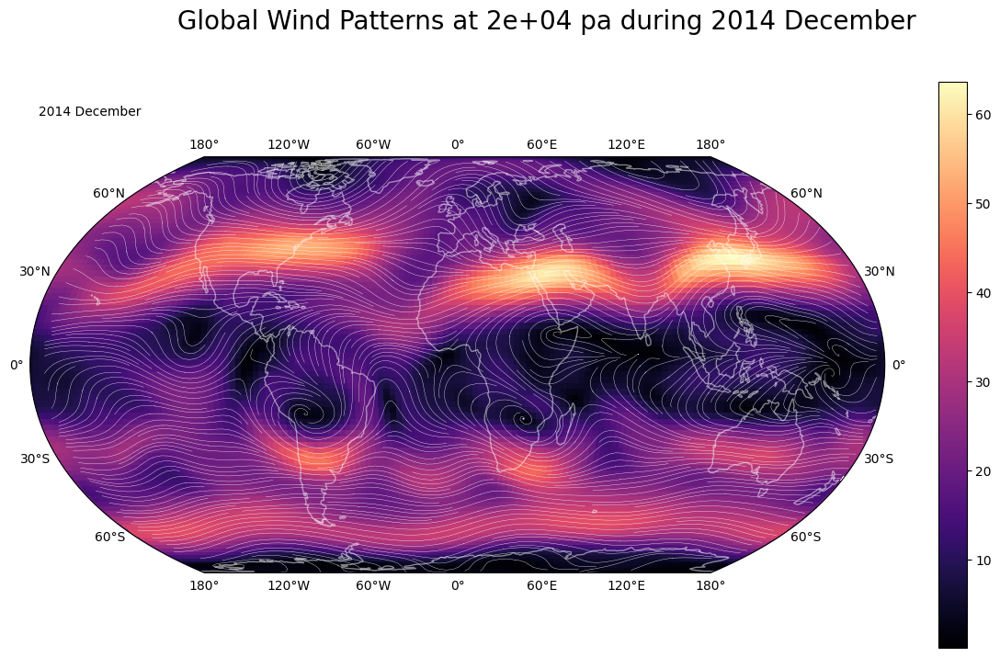

In [149]:
%%time

ds = ds_hist
n=-1


fig = plt.figure(figsize=(15,8))
ax = plt.axes(projection=ccrs.EqualEarth())

pu = ds.ua.isel(plev=9, time=-1)
pv = ds.va.isel(plev=9, time=-1)

windspeed = (pu**2 + pv**2)**0.5

pu = pu[::2,::2]
pv = pv[::2,::2]

ax.streamplot(pu.lon, pu.lat, pu, pv, transform=ccrs.PlateCarree(), density=4, arrowstyle='-', color='w', linewidth=0.25)
windspeed.plot(ax=ax, transform=ccrs.PlateCarree(), cmap='magma')
ax.coastlines(color='w', alpha=0.5)
ax.gridlines(draw_labels=True, color='none')
date = dt.strptime(str(ds.time[n].values), '%Y-%m-%d %H:%M:%S')
formatted = date.strftime('%Y %B')
ax.text(0.01, 1.1, formatted, ha='left', transform=ax.transAxes)
fig.suptitle('Global Wind Patterns at %.g pa during %s' %(ds.plev[9].values, formatted), size=20)
ax.set_title('')

CPU times: total: 6.58 s
Wall time: 5.06 s


Text(0.01, 1.1, '2014 December')

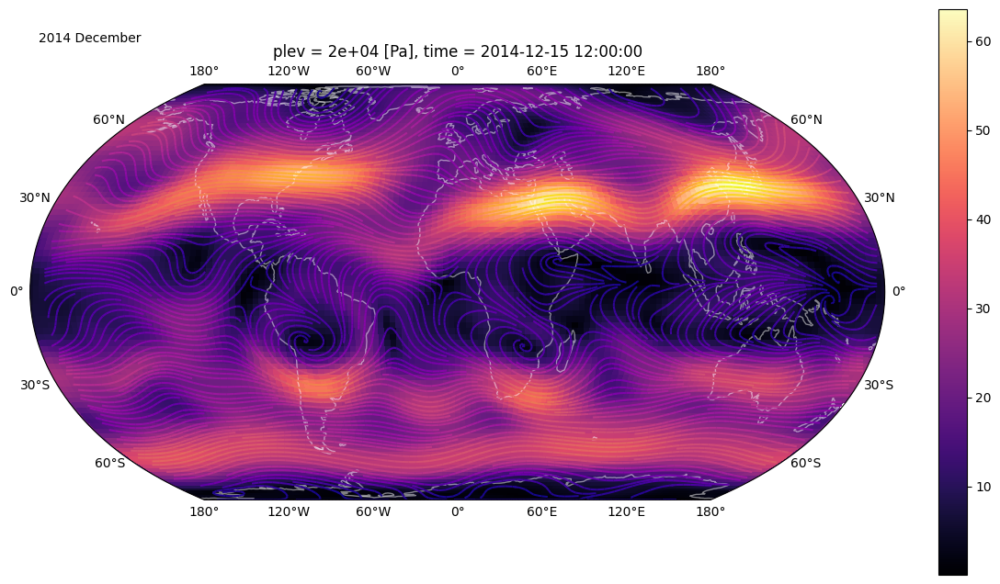

In [98]:
%%time

ds = ds_hist
n=-1

fig = plt.figure(figsize=(15,8))
ax = plt.axes(projection=ccrs.EqualEarth())

pu = ds.ua.isel(plev=9, time=-1)
pv = ds.va.isel(plev=9, time=-1)

windspeed = (pu**2 + pv**2)**0.5

pu = pu[::2,::2]
pv = pv[::2,::2]

ax.streamplot(pu.lon, pu.lat, pu, pv, transform=ccrs.PlateCarree(), density=4, arrowstyle='-', color=windspeed[::2,::2].values, cmap='plasma')
windspeed.plot(ax=ax, transform=ccrs.PlateCarree(), cmap='magma')
ax.coastlines(color='w', alpha=0.5)
ax.gridlines(draw_labels=True, color='none')
date = dt.strptime(str(ds.time[n].values), '%Y-%m-%d %H:%M:%S')
formatted = date.strftime('%Y %B')
ax.text(0.01, 1.1, formatted, ha='left', transform=ax.transAxes)

CPU times: total: 12.5 s
Wall time: 12.7 s


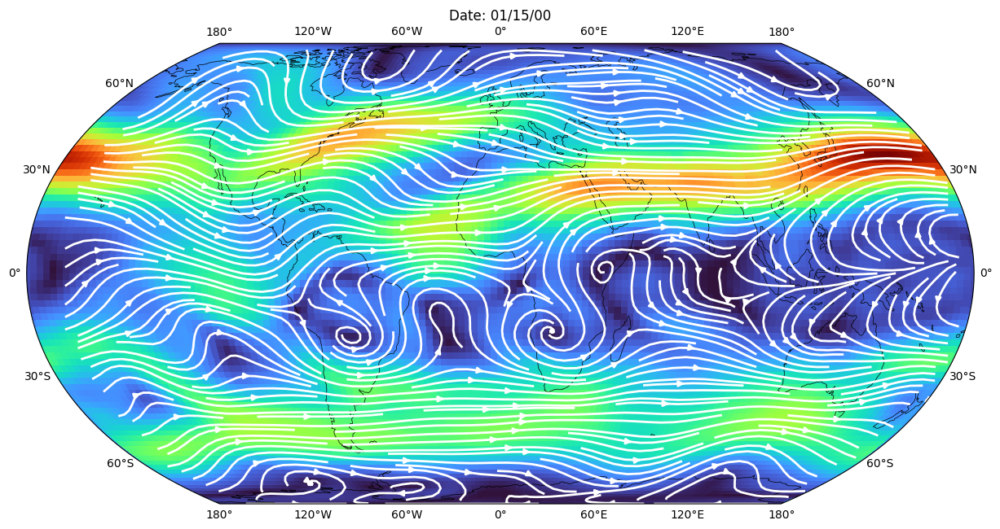

In [167]:
%%time

ds = ds_hist
pressure = 20000
frames = ds.ua.time.size

fig = plt.figure(figsize=(15,8))
ax = plt.axes(projection=ccrs.EqualEarth())

def animate(num):
    ax.clear()
    u = ds.ua.isel(time=num).sel(plev=pressure)
    v = ds.va.isel(time=num).sel(plev=pressure)
    
    windspeed = (u**2 + v**2)**0.5
    
    windspeed.plot(ax=ax, transform=ccrs.PlateCarree(), cmap='turbo')
    ax.collections[-2].colorbar.remove()

    u = u[::4, ::4]; v = v[::4, ::4]
    
    strm = ax.streamplot(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), color='w', density = 2.5, linewidth=2)
    # plt.colorbar(strm.lines)
    
    date = dt.strptime(str(ds.time[num].values), '%Y-%m-%d %H:%M:%S')
    formatted = date.strftime('%D')
    ax.set_title('Date: %s' %formatted, ha='center')
    ax.coastlines(color='k', lw=0.5)
    ax.gridlines(draw_labels=True, color='none')
    

ani = FuncAnimation(fig, animate, interval=200, frames=2)
ani.save('wind_strm_bg.gif', writer='pillow')


CPU times: total: 9min 30s
Wall time: 7min 11s


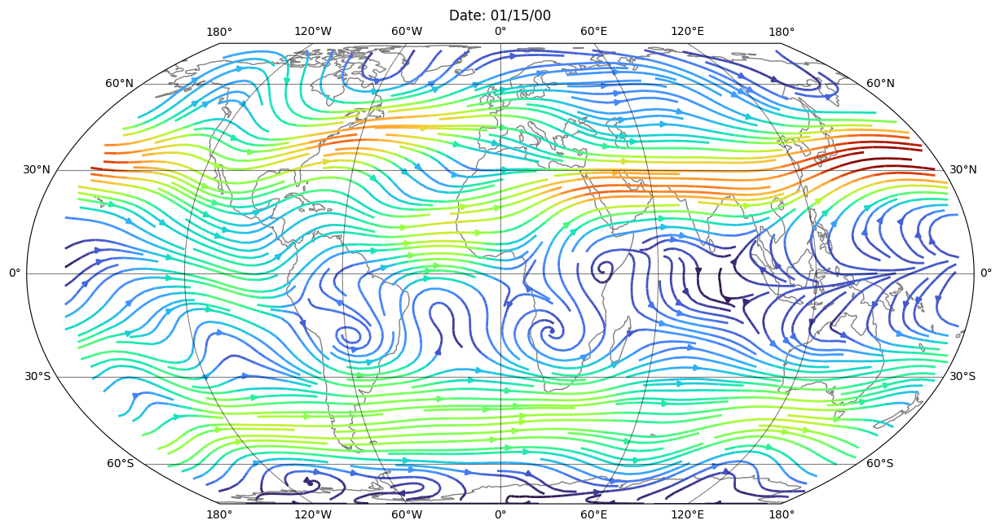

In [170]:
%%time

ds = ds_hist
pressure = 20000
frames = ds.ua.time.size

fig = plt.figure(figsize=(15,8))
ax = plt.axes(projection=ccrs.EqualEarth())

def animate(num):
    ax.clear()
    u = ds.ua.isel(time=num).sel(plev=pressure)[::4, ::4] # slicing to get every 4th element
    v = ds.va.isel(time=num).sel(plev=pressure)[::4, ::4]
    
    windspeed = (u**2 + v**2)**0.5
    
    strm = ax.streamplot(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), color=windspeed.values, cmap='turbo', density = 2.5, linewidth=2)
    # plt.colorbar(strm.lines)
    
    date = dt.strptime(str(ds.time[num].values), '%Y-%m-%d %H:%M:%S')
    formatted = date.strftime('%D')
    ax.set_title('Date: %s' %formatted, ha='center')
    ax.coastlines(color='grey')
    ax.gridlines(draw_labels=True, color='k', alpha=0.5)
    

ani = FuncAnimation(fig, animate, interval=200, frames=frames)
ani.save('wind_strm_turbo.gif', writer='pillow')


CPU times: total: 11.2 s
Wall time: 6.37 s


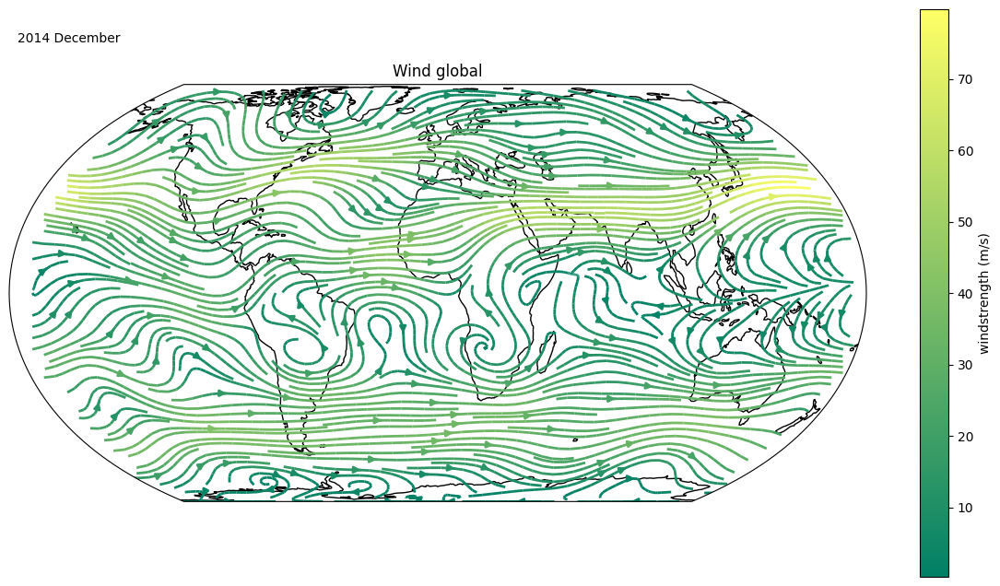

In [169]:
%%time

ds = ds_hist
pressure = 20000
frames = ds.ua.time.size

fig = plt.figure(figsize=(15,8))
ax = plt.axes(projection=ccrs.EqualEarth())

def animate(num):
    fig.clear()
    ax = plt.axes(projection=ccrs.EqualEarth())
    ax.set_title('Wind global')
    u = ds.ua.isel(time=num).sel(plev=pressure)[::2, ::2] # slicing to get every 4th element
    v = ds.va.isel(time=num).sel(plev=pressure)[::2, ::2]
    
    windspeed = (u**2 + v**2)**0.5
    
    strm = ax.streamplot(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), color=windspeed.values, cmap='summer', density = 2.5, linewidth=2)
    fig.colorbar(strm.lines, label='windstrength (m/s)')
    
    date = dt.strptime(str(ds.time[n].values), '%Y-%m-%d %H:%M:%S')
    formatted = date.strftime('%Y %B')
    ax.text(0.01, 1.1, formatted, ha='left', transform=ax.transAxes)
    ax.coastlines(color='k')
    # ax.gridlines(draw_labels=True, ls='--', color='darkolivegreen')
    

ani = FuncAnimation(fig, animate, interval=200, frames=2)
ani.save('wind_strm_summer.gif', writer='pillow')
